In [1]:
# <span style="color:red; font-size:32px;"><b><i>Import Libraries</i></b></span>

In [2]:
from pathlib import Path

INPUT_ROOT = Path("/kaggle/input")

print("Folders inside /kaggle/input:")
for item in INPUT_ROOT.iterdir():
    print(item)

Folders inside /kaggle/input:
/kaggle/input/datasets


In [3]:
for main_folder in INPUT_ROOT.iterdir():
    if main_folder.is_dir():
        print("\nMAIN:", main_folder)
        for sub in main_folder.iterdir():
            print("  ", sub)


MAIN: /kaggle/input/datasets
   /kaggle/input/datasets/banuprasadb


In [4]:
from pathlib import Path

BASE = Path("/kaggle/input/datasets/banuprasadb/visdrone-dataset/VisDrone_Dataset")

print("BASE exists:", BASE.exists())

for item in BASE.iterdir():
    print(item)

BASE exists: True
/kaggle/input/datasets/banuprasadb/visdrone-dataset/VisDrone_Dataset/VisDrone2019-DET-test-challenge
/kaggle/input/datasets/banuprasadb/visdrone-dataset/VisDrone_Dataset/VisDrone2019-DET-test-dev
/kaggle/input/datasets/banuprasadb/visdrone-dataset/VisDrone_Dataset/VisDrone2019-DET-train
/kaggle/input/datasets/banuprasadb/visdrone-dataset/VisDrone_Dataset/visdrone.yaml
/kaggle/input/datasets/banuprasadb/visdrone-dataset/VisDrone_Dataset/VisDrone2019-DET-val


In [5]:
!pip install -q ultralytics
!pip install -q ultralytics opencv-python matplotlib pandas numpy tqdm pyyaml

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 20.9 MB/s eta 0:00:00


# <span style="color:red; font-size:32px;"><b><i>Import Libraries</i></b></span>

In [6]:
import os
import cv2
import yaml
import time
import shutil
import random
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from pathlib import Path
from tqdm import tqdm
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [7]:
INPUT_ROOT = Path("/kaggle/input")
WORK_ROOT = Path("/kaggle/working")

DATA_ROOT = Path("/kaggle/input/datasets/banuprasadb/visdrone-dataset/VisDrone_Dataset")

TRAIN_DIR = DATA_ROOT / "VisDrone2019-DET-train"
VAL_DIR = DATA_ROOT / "VisDrone2019-DET-val"
TEST_DEV_DIR = DATA_ROOT / "VisDrone2019-DET-test-dev"

TRAIN_IMG_DIR = TRAIN_DIR / "images"
TRAIN_LBL_DIR = TRAIN_DIR / "labels"

VAL_IMG_DIR = VAL_DIR / "images"
VAL_LBL_DIR = VAL_DIR / "labels"

TEST_IMG_DIR = TEST_DEV_DIR / "images"

print("DATA_ROOT exists:", DATA_ROOT.exists())
print("Train images:", TRAIN_IMG_DIR.exists())
print("Train labels:", TRAIN_LBL_DIR.exists())
print("Val images:", VAL_IMG_DIR.exists())
print("Val labels:", VAL_LBL_DIR.exists())
print("Test images:", TEST_IMG_DIR.exists())

print("\nDataset folders:")
if DATA_ROOT.exists():
    for item in DATA_ROOT.iterdir():
        print(item)
else:
    print("DATA_ROOT path is wrong.")

DATA_ROOT exists: True
Train images: True
Train labels: True
Val images: True
Val labels: True
Test images: True

Dataset folders:
/kaggle/input/datasets/banuprasadb/visdrone-dataset/VisDrone_Dataset/VisDrone2019-DET-test-challenge
/kaggle/input/datasets/banuprasadb/visdrone-dataset/VisDrone_Dataset/VisDrone2019-DET-test-dev
/kaggle/input/datasets/banuprasadb/visdrone-dataset/VisDrone_Dataset/VisDrone2019-DET-train
/kaggle/input/datasets/banuprasadb/visdrone-dataset/VisDrone_Dataset/visdrone.yaml
/kaggle/input/datasets/banuprasadb/visdrone-dataset/VisDrone_Dataset/VisDrone2019-DET-val



# <span style="color:red; font-size:32px;"><b><i>Count images and labels</i></b></span>

In [8]:
def count_images(folder):
    return (
        len(list(folder.glob("*.jpg"))) +
        len(list(folder.glob("*.jpeg"))) +
        len(list(folder.glob("*.png")))
    )

def count_labels(folder):
    return len(list(folder.glob("*.txt")))

print("Training images:", count_images(TRAIN_IMG_DIR))
print("Training labels:", count_labels(TRAIN_LBL_DIR))

print("Validation images:", count_images(VAL_IMG_DIR))
print("Validation labels:", count_labels(VAL_LBL_DIR))

print("Test images:", count_images(TEST_IMG_DIR))

Training images: 6471
Training labels: 6471
Validation images: 548
Validation labels: 548
Test images: 1610


# <span style="color:red; font-size:32px;"><b><i>Check original class distribution</i></b></span>

In [9]:
def get_class_distribution(label_dir):
    class_counts = {}

    label_files = list(label_dir.glob("*.txt"))

    for label_file in tqdm(label_files):
        with open(label_file, "r") as f:
            for line in f:
                parts = line.strip().split()

                if len(parts) != 5:
                    continue

                class_id = int(float(parts[0]))
                class_counts[class_id] = class_counts.get(class_id, 0) + 1

    return dict(sorted(class_counts.items()))


train_class_counts = get_class_distribution(TRAIN_LBL_DIR)
val_class_counts = get_class_distribution(VAL_LBL_DIR)

print("Original train class distribution:")
print(train_class_counts)

print("\nOriginal validation class distribution:")
print(val_class_counts)

100%|██████████| 548/548 [00:02<00:00, 228.97it/s]

Original train class distribution:
{0: 79337, 1: 27059, 2: 10480, 3: 144867, 4: 24956, 5: 12875, 6: 4812, 7: 3246, 8: 5926, 9: 29647}

Original validation class distribution:
{0: 8844, 1: 5125, 2: 1287, 3: 14064, 4: 1975, 5: 750, 6: 1045, 7: 532, 8: 251, 9: 4886}


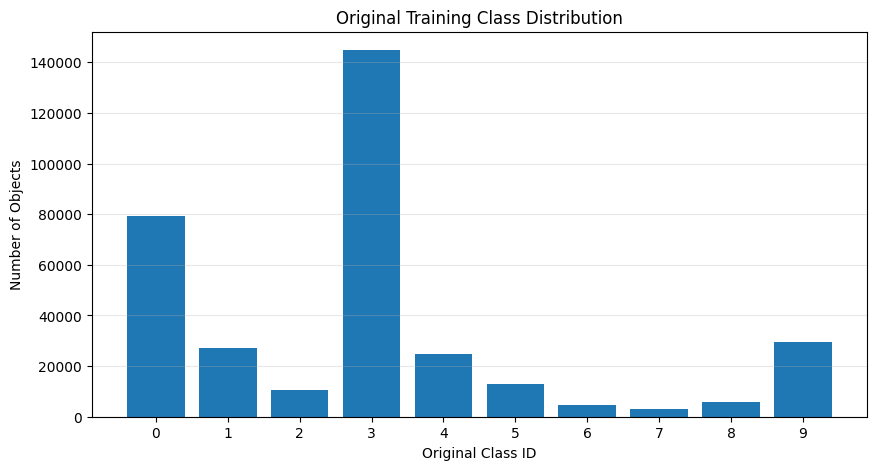

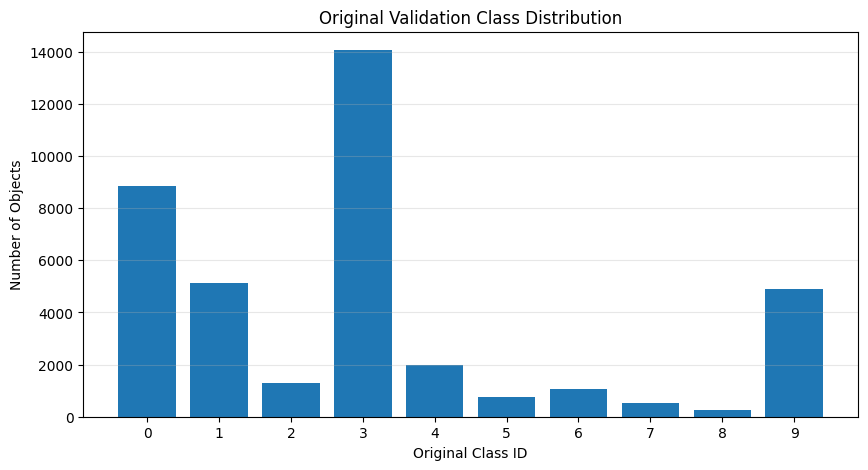

In [10]:
def plot_class_distribution(class_counts, title):
    classes = list(class_counts.keys())
    counts = list(class_counts.values())

    plt.figure(figsize=(10, 5))
    plt.bar(classes, counts)
    plt.xlabel("Original Class ID")
    plt.ylabel("Number of Objects")
    plt.title(title)
    plt.xticks(classes)
    plt.grid(axis="y", alpha=0.3)
    plt.show()


plot_class_distribution(train_class_counts, "Original Training Class Distribution")
plot_class_distribution(val_class_counts, "Original Validation Class Distribution")

# <span style="color:red; font-size:32px;"><b><i>Class mapping</i></b></span>

In [11]:
CLASS_MAP = {
    0: 0,  # pedestrian -> human
    1: 0,  # people -> human
    3: 1   # car -> car
}

NEW_CLASS_NAMES = {
    0: "human",
    1: "car"
}

print("Final classes:")
print("0 = human")
print("1 = car")

Final classes:
0 = human
1 = car


# <span style="color:red; font-size:32px;"><b><i>Create filtered dataset folders</i></b></span>

In [12]:
PROJECT_DIR = WORK_ROOT / "drone_human_car_dataset"

FINAL_TRAIN_IMG = PROJECT_DIR / "images/train"
FINAL_VAL_IMG = PROJECT_DIR / "images/val"

FINAL_TRAIN_LBL = PROJECT_DIR / "labels/train"
FINAL_VAL_LBL = PROJECT_DIR / "labels/val"

for folder in [FINAL_TRAIN_IMG, FINAL_VAL_IMG, FINAL_TRAIN_LBL, FINAL_VAL_LBL]:
    folder.mkdir(parents=True, exist_ok=True)

print("Filtered dataset location:", PROJECT_DIR)

Filtered dataset location: /kaggle/working/drone_human_car_dataset


# <span style="color:red; font-size:32px;"><b><i>Filter labels and copy images</i></b></span>

In [13]:
def filter_and_copy_dataset(src_img_dir, src_lbl_dir, dst_img_dir, dst_lbl_dir, keep_empty=False):
    image_files = []
    image_files.extend(list(src_img_dir.glob("*.jpg")))
    image_files.extend(list(src_img_dir.glob("*.jpeg")))
    image_files.extend(list(src_img_dir.glob("*.png")))

    kept_images = 0
    kept_objects = 0
    skipped_images = 0

    for img_path in tqdm(image_files):
        label_path = src_lbl_dir / f"{img_path.stem}.txt"

        if not label_path.exists():
            skipped_images += 1
            continue

        new_lines = []

        with open(label_path, "r") as f:
            for line in f:
                parts = line.strip().split()

                if len(parts) != 5:
                    continue

                old_class = int(float(parts[0]))

                if old_class not in CLASS_MAP:
                    continue

                new_class = CLASS_MAP[old_class]

                x_center = parts[1]
                y_center = parts[2]
                width = parts[3]
                height = parts[4]

                new_lines.append(f"{new_class} {x_center} {y_center} {width} {height}")

        if len(new_lines) > 0 or keep_empty:
            shutil.copy(img_path, dst_img_dir / img_path.name)

            with open(dst_lbl_dir / f"{img_path.stem}.txt", "w") as f:
                f.write("\n".join(new_lines))

            kept_images += 1
            kept_objects += len(new_lines)
        else:
            skipped_images += 1

    return kept_images, kept_objects, skipped_images


train_result = filter_and_copy_dataset(
    TRAIN_IMG_DIR,
    TRAIN_LBL_DIR,
    FINAL_TRAIN_IMG,
    FINAL_TRAIN_LBL,
    keep_empty=False
)

val_result = filter_and_copy_dataset(
    VAL_IMG_DIR,
    VAL_LBL_DIR,
    FINAL_VAL_IMG,
    FINAL_VAL_LBL,
    keep_empty=False
)

print("Train result:", train_result)
print("Val result:", val_result)
print("Format: kept_images, kept_objects, skipped_images")

100%|██████████| 548/548 [00:05<00:00, 99.09it/s]

Train result: (6468, 251263, 3)
Val result: (548, 28033, 0)
Format: kept_images, kept_objects, skipped_images


# <span style="color:red; font-size:32px;"><b><i>Verify final labels</i></b></span>

100%|██████████| 548/548 [00:00<00:00, 16328.83it/s]


Filtered train class distribution:
{0: 106396, 1: 144867}

Filtered validation class distribution:
{0: 13969, 1: 14064}


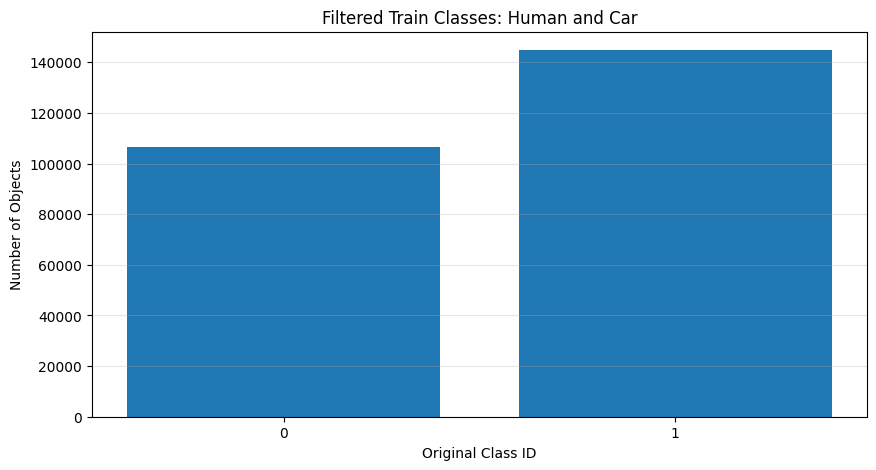

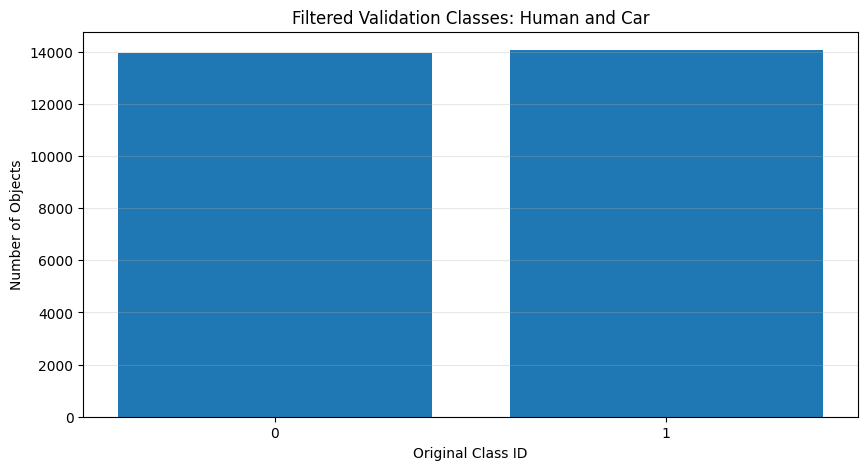

In [14]:
final_train_counts = get_class_distribution(FINAL_TRAIN_LBL)
final_val_counts = get_class_distribution(FINAL_VAL_LBL)

print("Filtered train class distribution:")
print(final_train_counts)

print("\nFiltered validation class distribution:")
print(final_val_counts)

plot_class_distribution(final_train_counts, "Filtered Train Classes: Human and Car")
plot_class_distribution(final_val_counts, "Filtered Validation Classes: Human and Car")

# <span style="color:red; font-size:32px;"><b><i>Visualize sample labels</i></b></span>

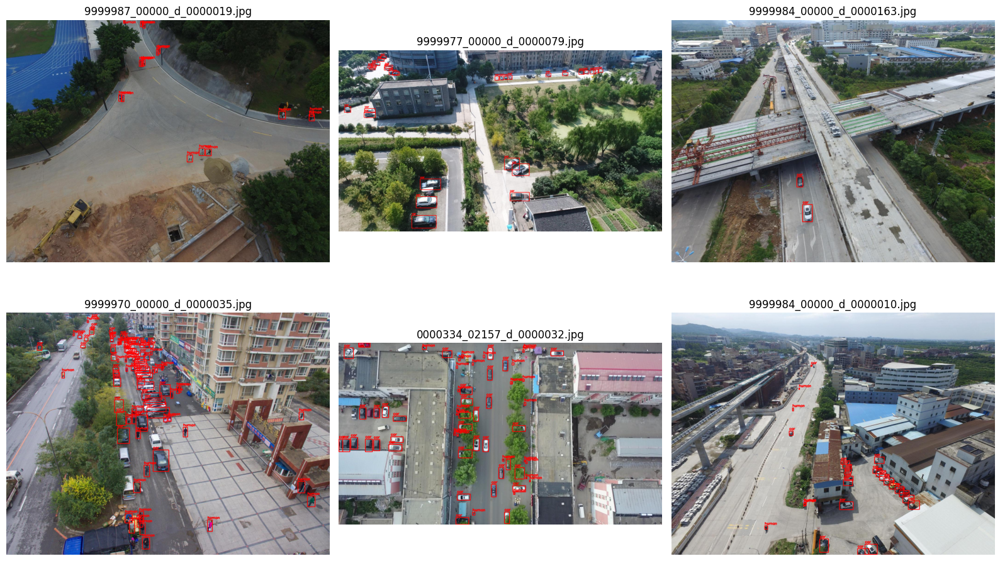

In [15]:
def draw_yolo_boxes(image_path, label_path, class_names):
    image = cv2.imread(str(image_path))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    h, w, _ = image.shape

    if label_path.exists():
        with open(label_path, "r") as f:
            for line in f:
                parts = line.strip().split()

                if len(parts) != 5:
                    continue

                cls_id = int(parts[0])
                x_center = float(parts[1]) * w
                y_center = float(parts[2]) * h
                box_w = float(parts[3]) * w
                box_h = float(parts[4]) * h

                x1 = int(x_center - box_w / 2)
                y1 = int(y_center - box_h / 2)
                x2 = int(x_center + box_w / 2)
                y2 = int(y_center + box_h / 2)

                cv2.rectangle(image, (x1, y1), (x2, y2), (255, 0, 0), 2)
                cv2.putText(
                    image,
                    class_names[cls_id],
                    (x1, max(y1 - 5, 15)),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    0.5,
                    (255, 0, 0),
                    2
                )

    return image


sample_train_images = list(FINAL_TRAIN_IMG.glob("*.jpg"))
sample_train_images = random.sample(sample_train_images, min(6, len(sample_train_images)))

plt.figure(figsize=(16, 10))

for i, img_path in enumerate(sample_train_images):
    label_path = FINAL_TRAIN_LBL / f"{img_path.stem}.txt"
    image = draw_yolo_boxes(img_path, label_path, NEW_CLASS_NAMES)

    plt.subplot(2, 3, i + 1)
    plt.imshow(image)
    plt.axis("off")
    plt.title(img_path.name)

plt.tight_layout()
plt.show()

# <span style="color:red; font-size:32px;"><b><i>Create final data.yaml</i></b></span>

In [16]:
FINAL_YAML_PATH = PROJECT_DIR / "data.yaml"

data_yaml = {
    "path": str(PROJECT_DIR),
    "train": "images/train",
    "val": "images/val",
    "names": {
        0: "human",
        1: "car"
    }
}

with open(FINAL_YAML_PATH, "w") as f:
    yaml.dump(data_yaml, f)

print(open(FINAL_YAML_PATH).read())

names:
  0: human
  1: car
path: /kaggle/working/drone_human_car_dataset
train: images/train
val: images/val



# <span style="color:red; font-size:32px;"><b><i>Train YOLO model</i></b></span>

In [17]:
DEVICE = 0 if torch.cuda.is_available() else "cpu"

MODEL_NAME = "yolo11m.pt"   # If memory error, use yolo11s.pt
IMAGE_SIZE = 960
EPOCHS = 50
BATCH = 8

print("Using device:", DEVICE)

model = YOLO(MODEL_NAME)

train_results = model.train(
    data=str(FINAL_YAML_PATH),
    epochs=EPOCHS,
    imgsz=IMAGE_SIZE,
    batch=BATCH,
    patience=10,
    workers=2,
    device=DEVICE,
    project="/kaggle/working/runs",
    name="yolo_human_car_detector",
    pretrained=True,
    optimizer="auto",
    cos_lr=True,
    close_mosaic=10,
    augment=True,
    degrees=5,
    translate=0.1,
    scale=0.5,
    fliplr=0.5,
    mosaic=1.0,
    mixup=0.1
)



# MODEL_NAME = "yolo11s.pt"
# IMAGE_SIZE = 640
# BATCH = 4

Using device: 0
Ultralytics 8.4.50 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=True, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/kaggle/working/drone_human_car_dataset/data.yaml, degrees=5, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=960, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.1, mode=train, model=yolo11m.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolo_human_car_detector, nbs=64, nms=False, opset=None, optimize=False, op

In [18]:
RUN_DIR = Path("/kaggle/working/runs/yolo_human_car_detector")
BEST_MODEL_PATH = RUN_DIR / "weights/best.pt"

print("Best model:", BEST_MODEL_PATH)
print("Exists:", BEST_MODEL_PATH.exists())

Best model: /kaggle/working/runs/yolo_human_car_detector/weights/best.pt
Exists: True


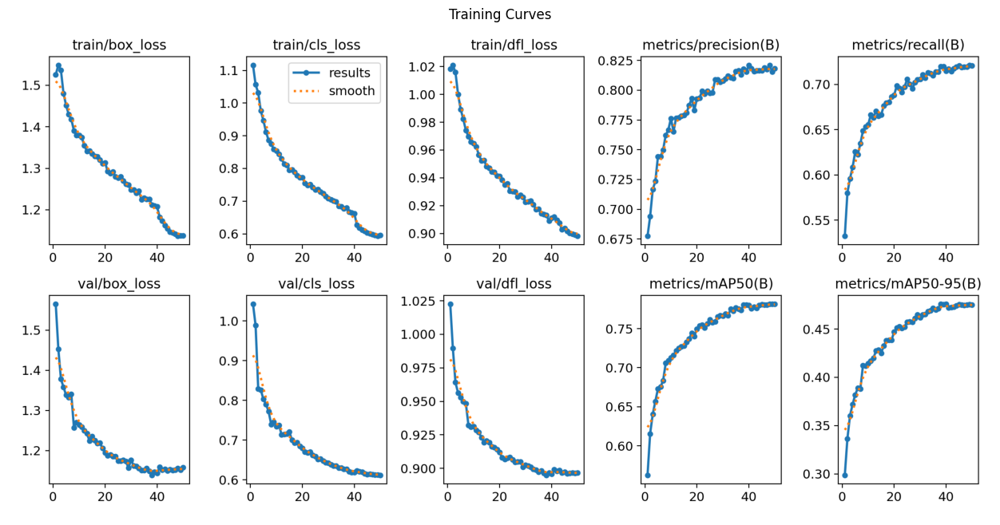

In [19]:
results_png = RUN_DIR / "results.png"

if results_png.exists():
    image = cv2.imread(str(results_png))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(16, 8))
    plt.imshow(image)
    plt.axis("off")
    plt.title("Training Curves")
    plt.show()
else:
    print("results.png not found")

# <span style="color:red; font-size:32px;"><b><i>Show confusion matrix</i></b></span>

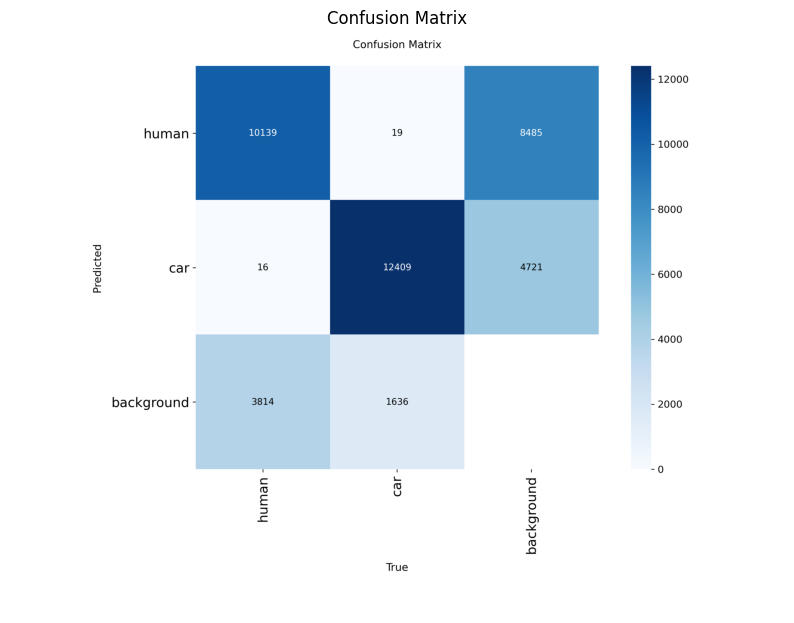

In [20]:
confusion_matrix_path = RUN_DIR / "confusion_matrix.png"

if confusion_matrix_path.exists():
    image = cv2.imread(str(confusion_matrix_path))
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(10, 8))
    plt.imshow(image)
    plt.axis("off")
    plt.title("Confusion Matrix")
    plt.show()
else:
    print("confusion_matrix.png not found")

# <span style="color:red; font-size:32px;"><b><i>Trained detector</i></b></span>

In [21]:
detector = YOLO(str(BEST_MODEL_PATH))

val_images = list(FINAL_VAL_IMG.glob("*.jpg"))

sample_val_images = random.sample(val_images, min(10, len(val_images)))

print("Number of sample validation images:", len(sample_val_images))

Number of sample validation images: 10


# <span style="color:red; font-size:32px;"><b><i>Detection Settings</i></b></span>

In [22]:
# Normal YOLO confidence
NORMAL_CONF = 0.25

# Tiled YOLO confidence
# Start with 0.20 for drone/aerial images.
# Use 0.15 if many humans are missed.
# Use 0.30 if too many false detections appear.
TILED_CONF = 0.20

# Tiled detection settings
TILE_SIZE = 512
TILE_OVERLAP = 0.25
TILE_IMGSZ = 640
NMS_IOU = 0.50

# Adaptive decision thresholds
# If image area is large, adaptive mode will use tiled YOLO.
ADAPTIVE_HIGH_RES_AREA = 700000

# If normal YOLO already finds many objects, image may be crowded.
ADAPTIVE_CROWDED_DET_COUNT = 12

# If detected boxes are very small compared to image size, use tiled YOLO.
ADAPTIVE_SMALL_BOX_RATIO = 0.003

print("NORMAL_CONF:", NORMAL_CONF)
print("TILED_CONF:", TILED_CONF)
print("TILE_SIZE:", TILE_SIZE)
print("TILE_OVERLAP:", TILE_OVERLAP)
print("TILE_IMGSZ:", TILE_IMGSZ)
print("NMS_IOU:", NMS_IOU)

NORMAL_CONF: 0.25
TILED_CONF: 0.2
TILE_SIZE: 512
TILE_OVERLAP: 0.25
TILE_IMGSZ: 640
NMS_IOU: 0.5


# <span style="color:red; font-size:32px;"><b><i>Helper functions for NMS and drawing</i></b></span>

In [23]:
def calculate_iou(box, boxes):
    x1 = np.maximum(box[0], boxes[:, 0])
    y1 = np.maximum(box[1], boxes[:, 1])
    x2 = np.minimum(box[2], boxes[:, 2])
    y2 = np.minimum(box[3], boxes[:, 3])

    inter_w = np.maximum(0, x2 - x1)
    inter_h = np.maximum(0, y2 - y1)
    inter_area = inter_w * inter_h

    box_area = max(0, box[2] - box[0]) * max(0, box[3] - box[1])
    boxes_area = np.maximum(0, boxes[:, 2] - boxes[:, 0]) * np.maximum(0, boxes[:, 3] - boxes[:, 1])

    union_area = box_area + boxes_area - inter_area + 1e-6

    return inter_area / union_area


def nms_per_class(boxes, scores, classes, iou_threshold=0.5):
    if len(boxes) == 0:
        return np.array([]), np.array([]), np.array([])

    boxes = np.array(boxes)
    scores = np.array(scores)
    classes = np.array(classes)

    final_indices = []

    for cls in np.unique(classes):
        cls_indices = np.where(classes == cls)[0]
        cls_boxes = boxes[cls_indices]
        cls_scores = scores[cls_indices]

        order = np.argsort(cls_scores)[::-1]

        while len(order) > 0:
            current = order[0]
            final_indices.append(cls_indices[current])

            if len(order) == 1:
                break

            ious = calculate_iou(cls_boxes[current], cls_boxes[order[1:]])
            keep = np.where(ious < iou_threshold)[0]
            order = order[keep + 1]

    final_indices = np.array(final_indices)

    return boxes[final_indices], scores[final_indices], classes[final_indices]


def draw_boxes_and_count(image_path, boxes, scores, classes, output_path, title_text):
    image = cv2.imread(str(image_path))

    human_count = 0
    car_count = 0

    for box, score, cls_id in zip(boxes, scores, classes):
        cls_id = int(cls_id)

        x1, y1, x2, y2 = box.astype(int)

        if cls_id == 0:
            human_count += 1
            color = (0, 255, 0)
            label = f"human {score:.2f}"
        elif cls_id == 1:
            car_count += 1
            color = (255, 0, 0)
            label = f"car {score:.2f}"
        else:
            continue

        cv2.rectangle(image, (x1, y1), (x2, y2), color, 2)
        cv2.putText(
            image,
            label,
            (x1, max(y1 - 5, 15)),
            cv2.FONT_HERSHEY_SIMPLEX,
            0.5,
            color,
            2
        )

    overlay_text = f"{title_text} | Humans: {human_count} | Cars: {car_count}"

    cv2.rectangle(image, (15, 15), (min(1000, image.shape[1] - 10), 75), (0, 0, 0), -1)
    cv2.putText(
        image,
        overlay_text,
        (25, 55),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.75,
        (255, 255, 255),
        2
    )

    cv2.imwrite(str(output_path), image)

    return human_count, car_count


def show_images_from_folder(folder, title, max_images=6):
    image_paths = list(Path(folder).glob("*.jpg")) + list(Path(folder).glob("*.png"))

    if len(image_paths) == 0:
        print("No images found in", folder)
        return

    image_paths = image_paths[:max_images]

    plt.figure(figsize=(16, 10))

    for i, img_path in enumerate(image_paths):
        image = cv2.imread(str(img_path))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        plt.subplot(2, 3, i + 1)
        plt.imshow(image)
        plt.axis("off")
        plt.title(img_path.name)

    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

# <span style="color:red; font-size:32px;"><b><i>Normal YOLO detection function</i></b></span>

In [24]:
def normal_yolo_detect(image_path, model, conf=NORMAL_CONF, imgsz=IMAGE_SIZE):
    results = model.predict(
        source=str(image_path),
        conf=conf,
        imgsz=imgsz,
        verbose=False
    )

    result = results[0]

    boxes = []
    scores = []
    classes = []

    for box in result.boxes:
        cls_id = int(box.cls[0])
        score = float(box.conf[0])
        xyxy = box.xyxy[0].cpu().numpy()

        boxes.append(xyxy)
        scores.append(score)
        classes.append(cls_id)

    if len(boxes) == 0:
        return np.array([]), np.array([]), np.array([])

    return np.array(boxes), np.array(scores), np.array(classes)

# <span style="color:red; font-size:32px;"><b><i>Tiled YOLO detection function</i></b></span>

In [25]:
def get_tile_starts(length, tile_size, stride):
    if length <= tile_size:
        return [0]

    starts = list(range(0, length - tile_size + 1, stride))

    last_start = length - tile_size

    if starts[-1] != last_start:
        starts.append(last_start)

    return starts


def tiled_yolo_detect(
    image_path,
    model,
    tile_size=TILE_SIZE,
    overlap=TILE_OVERLAP,
    conf=TILED_CONF,
    imgsz=TILE_IMGSZ,
    nms_iou=NMS_IOU
):
    image = cv2.imread(str(image_path))
    h, w, _ = image.shape

    stride = int(tile_size * (1 - overlap))
    stride = max(1, stride)

    all_boxes = []
    all_scores = []
    all_classes = []

    y_starts = get_tile_starts(h, tile_size, stride)
    x_starts = get_tile_starts(w, tile_size, stride)

    for y1 in y_starts:
        for x1 in x_starts:
            x2 = min(x1 + tile_size, w)
            y2 = min(y1 + tile_size, h)

            tile = image[y1:y2, x1:x2]

            if tile.shape[0] < 64 or tile.shape[1] < 64:
                continue

            results = model.predict(
                source=tile,
                conf=conf,
                imgsz=imgsz,
                verbose=False
            )

            result = results[0]

            for box in result.boxes:
                cls_id = int(box.cls[0])
                score = float(box.conf[0])
                xyxy = box.xyxy[0].cpu().numpy()

                xyxy[0] += x1
                xyxy[1] += y1
                xyxy[2] += x1
                xyxy[3] += y1

                xyxy[0] = max(0, min(xyxy[0], w - 1))
                xyxy[1] = max(0, min(xyxy[1], h - 1))
                xyxy[2] = max(0, min(xyxy[2], w - 1))
                xyxy[3] = max(0, min(xyxy[3], h - 1))

                all_boxes.append(xyxy)
                all_scores.append(score)
                all_classes.append(cls_id)

    if len(all_boxes) == 0:
        return np.array([]), np.array([]), np.array([])

    final_boxes, final_scores, final_classes = nms_per_class(
        all_boxes,
        all_scores,
        all_classes,
        iou_threshold=nms_iou
    )

    return final_boxes, final_scores, final_classes

# <span style="color:red; font-size:32px;"><b><i>detection function</i></b></span>

In [26]:
def adaptive_hybrid_detect(
    image_path,
    model,
    normal_conf=NORMAL_CONF,
    tiled_conf=TILED_CONF,
    normal_imgsz=IMAGE_SIZE,
    tile_size=TILE_SIZE,
    tile_overlap=TILE_OVERLAP,
    tile_imgsz=TILE_IMGSZ,
    nms_iou=NMS_IOU
):
    image = cv2.imread(str(image_path))
    h, w, _ = image.shape
    image_area = h * w

    normal_boxes, normal_scores, normal_classes = normal_yolo_detect(
        image_path=image_path,
        model=model,
        conf=normal_conf,
        imgsz=normal_imgsz
    )

    number_of_detections = len(normal_boxes)

    if number_of_detections > 0:
        box_areas = (normal_boxes[:, 2] - normal_boxes[:, 0]) * (normal_boxes[:, 3] - normal_boxes[:, 1])
        median_box_area_ratio = np.median(box_areas / image_area)
    else:
        median_box_area_ratio = 0

    is_high_resolution = image_area >= ADAPTIVE_HIGH_RES_AREA
    is_crowded = number_of_detections >= ADAPTIVE_CROWDED_DET_COUNT
    is_small_object_heavy = number_of_detections > 0 and median_box_area_ratio < ADAPTIVE_SMALL_BOX_RATIO
    has_no_detection_but_large_image = number_of_detections == 0 and is_high_resolution

    use_tiled = (
        is_high_resolution or
        is_crowded or
        is_small_object_heavy or
        has_no_detection_but_large_image
    )

    if use_tiled:
        boxes, scores, classes = tiled_yolo_detect(
            image_path=image_path,
            model=model,
            tile_size=tile_size,
            overlap=tile_overlap,
            conf=tiled_conf,
            imgsz=tile_imgsz,
            nms_iou=nms_iou
        )

        method_used = "Adaptive: Tiled YOLO"
    else:
        boxes, scores, classes = normal_boxes, normal_scores, normal_classes
        method_used = "Adaptive: Normal YOLO"

    decision_info = {
        "image_width": w,
        "image_height": h,
        "image_area": image_area,
        "normal_detection_count": number_of_detections,
        "median_box_area_ratio": median_box_area_ratio,
        "is_high_resolution": is_high_resolution,
        "is_crowded": is_crowded,
        "is_small_object_heavy": is_small_object_heavy,
        "method_used": method_used
    }

    return boxes, scores, classes, method_used, decision_info

# <span style="color:red; font-size:32px;"><b><i>Create output folders</i></b></span>

In [27]:
OUTPUT_1_NORMAL = WORK_ROOT / "output_1_normal_yolo"
OUTPUT_2_ADAPTIVE = WORK_ROOT / "output_2_adaptive_hybrid"
OUTPUT_3_DENSITY = WORK_ROOT / "output_3_crowd_density"
OUTPUT_4_TILED = WORK_ROOT / "output_4_always_tiled_yolo"

for folder in [OUTPUT_1_NORMAL, OUTPUT_2_ADAPTIVE, OUTPUT_3_DENSITY, OUTPUT_4_TILED]:
    folder.mkdir(parents=True, exist_ok=True)

print("Output folders created.")

Output folders created.


# <span style="color:red; font-size:32px;"><b><i>Output 1 — Normal YOLO detection</i></b></span>

In [28]:
normal_records = []

for img_path in tqdm(sample_val_images):
    start_time = time.time()

    boxes, scores, classes = normal_yolo_detect(
        image_path=img_path,
        model=detector,
        conf=NORMAL_CONF,
        imgsz=IMAGE_SIZE
    )

    output_path = OUTPUT_1_NORMAL / f"normal_{img_path.name}"

    humans, cars = draw_boxes_and_count(
        image_path=img_path,
        boxes=boxes,
        scores=scores,
        classes=classes,
        output_path=output_path,
        title_text="Normal YOLO"
    )

    elapsed = time.time() - start_time

    normal_records.append({
        "image": img_path.name,
        "method": "Normal YOLO",
        "humans": humans,
        "cars": cars,
        "time_sec": elapsed,
        "output_path": str(output_path)
    })

normal_df = pd.DataFrame(normal_records)
normal_df

100%|██████████| 10/10 [00:00<00:00, 11.94it/s]


,image,method,humans,cars,time_sec,output_path
0,0000356_01961_d_0000639.jpg,Normal YOLO,19,35,0.359670,/kaggle/working/output_1_normal_yolo/normal_00...
1,0000289_06401_d_0000843.jpg,Normal YOLO,22,36,0.061491,/kaggle/working/output_1_normal_yolo/normal_00...
2,0000154_02001_d_0000001.jpg,Normal YOLO,41,19,0.051273,/kaggle/working/output_1_normal_yolo/normal_00...
3,0000103_04948_d_0000035.jpg,Normal YOLO,0,0,0.051771,/kaggle/working/output_1_normal_yolo/normal_00...
4,0000360_05293_d_0000740.jpg,Normal YOLO,14,33,0.053779,/kaggle/working/output_1_normal_yolo/normal_00...
5,0000242_00500_d_0000002.jpg,Normal YOLO,4,21,0.043312,/kaggle/working/output_1_normal_yolo/normal_00...
6,0000291_04001_d_0000888.jpg,Normal YOLO,49,34,0.058633,/kaggle/working/output_1_normal_yolo/normal_00...
7,0000360_02353_d_0000725.jpg,Normal YOLO,21,37,0.055843,/kaggle/working/output_1_normal_yolo/normal_00...
8,0000271_02601_d_0000386.jpg,Normal YOLO,21,24,0.049589,/kaggle/working/output_1_normal_yolo/normal_00...
9,0000333_02941_d_0000016.jpg,Normal YOLO,11,24,0.047236,/kaggle/working/output_1_normal_yolo/normal_00...


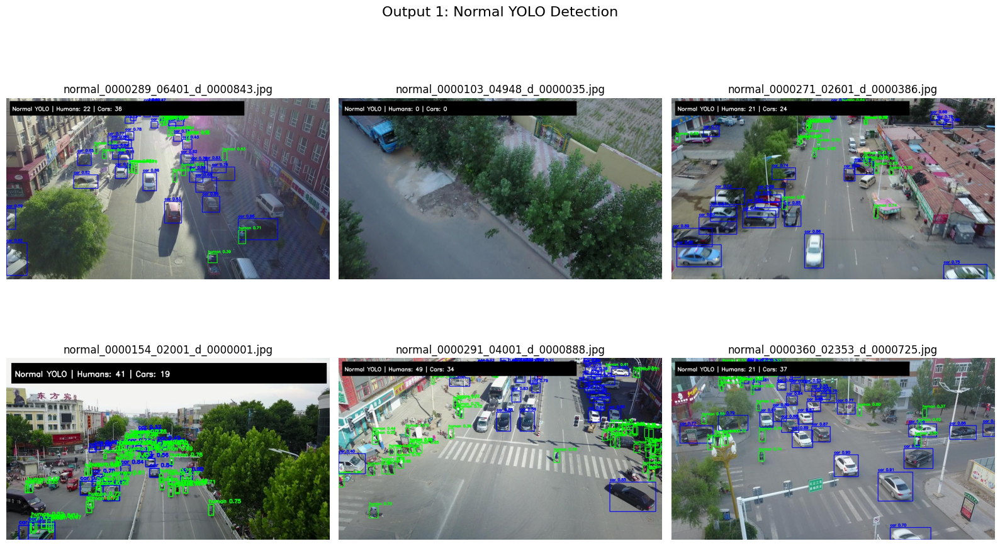

In [29]:
show_images_from_folder(OUTPUT_1_NORMAL, "Output 1: Normal YOLO Detection")

# <span style="color:red; font-size:32px;"><b><i>Output 2 — Adaptive hybrid detection</i></b></span>

In [30]:
adaptive_records = []
adaptive_decision_records = []

for img_path in tqdm(sample_val_images):
    start_time = time.time()

    boxes, scores, classes, method_used, decision_info = adaptive_hybrid_detect(
        image_path=img_path,
        model=detector,
        normal_conf=NORMAL_CONF,
        tiled_conf=TILED_CONF,
        normal_imgsz=IMAGE_SIZE,
        tile_size=TILE_SIZE,
        tile_overlap=TILE_OVERLAP,
        tile_imgsz=TILE_IMGSZ,
        nms_iou=NMS_IOU
    )

    output_path = OUTPUT_2_ADAPTIVE / f"adaptive_{img_path.name}"

    humans, cars = draw_boxes_and_count(
        image_path=img_path,
        boxes=boxes,
        scores=scores,
        classes=classes,
        output_path=output_path,
        title_text=method_used
    )

    elapsed = time.time() - start_time

    adaptive_records.append({
        "image": img_path.name,
        "method": method_used,
        "humans": humans,
        "cars": cars,
        "time_sec": elapsed,
        "output_path": str(output_path)
    })

    decision_info["image"] = img_path.name
    adaptive_decision_records.append(decision_info)

adaptive_df = pd.DataFrame(adaptive_records)
adaptive_decision_df = pd.DataFrame(adaptive_decision_records)

adaptive_df

100%|██████████| 10/10 [00:02<00:00,  3.52it/s]


,image,method,humans,cars,time_sec,output_path
0,0000356_01961_d_0000639.jpg,Adaptive: Tiled YOLO,39,42,0.418569,/kaggle/working/output_2_adaptive_hybrid/adapt...
1,0000289_06401_d_0000843.jpg,Adaptive: Tiled YOLO,26,49,0.293004,/kaggle/working/output_2_adaptive_hybrid/adapt...
2,0000154_02001_d_0000001.jpg,Adaptive: Tiled YOLO,56,26,0.226059,/kaggle/working/output_2_adaptive_hybrid/adapt...
3,0000103_04948_d_0000035.jpg,Adaptive: Tiled YOLO,0,1,0.264621,/kaggle/working/output_2_adaptive_hybrid/adapt...
4,0000360_05293_d_0000740.jpg,Adaptive: Tiled YOLO,16,44,0.282237,/kaggle/working/output_2_adaptive_hybrid/adapt...
5,0000242_00500_d_0000002.jpg,Adaptive: Tiled YOLO,4,29,0.211633,/kaggle/working/output_2_adaptive_hybrid/adapt...
6,0000291_04001_d_0000888.jpg,Adaptive: Tiled YOLO,58,43,0.290413,/kaggle/working/output_2_adaptive_hybrid/adapt...
7,0000360_02353_d_0000725.jpg,Adaptive: Tiled YOLO,24,47,0.284764,/kaggle/working/output_2_adaptive_hybrid/adapt...
8,0000271_02601_d_0000386.jpg,Adaptive: Tiled YOLO,22,34,0.278706,/kaggle/working/output_2_adaptive_hybrid/adapt...
9,0000333_02941_d_0000016.jpg,Adaptive: Tiled YOLO,15,30,0.278080,/kaggle/working/output_2_adaptive_hybrid/adapt...


In [31]:
adaptive_decision_df

,image_width,image_height,image_area,normal_detection_count,median_box_area_ratio,is_high_resolution,is_crowded,is_small_object_heavy,method_used,image
0,1360,765,1040400,54,0.001043,True,True,True,Adaptive: Tiled YOLO,0000356_01961_d_0000639.jpg
1,1360,765,1040400,58,0.000745,True,True,True,Adaptive: Tiled YOLO,0000289_06401_d_0000843.jpg
2,960,540,518400,60,0.000470,False,True,True,Adaptive: Tiled YOLO,0000154_02001_d_0000001.jpg
3,1360,765,1040400,0,0.000000,True,False,False,Adaptive: Tiled YOLO,0000103_04948_d_0000035.jpg
4,1360,765,1040400,47,0.000598,True,True,True,Adaptive: Tiled YOLO,0000360_05293_d_0000740.jpg
5,960,540,518400,25,0.000358,False,True,True,Adaptive: Tiled YOLO,0000242_00500_d_0000002.jpg
6,1360,765,1040400,83,0.000894,True,True,True,Adaptive: Tiled YOLO,0000291_04001_d_0000888.jpg
7,1360,765,1040400,58,0.001006,True,True,True,Adaptive: Tiled YOLO,0000360_02353_d_0000725.jpg
8,1360,765,1040400,45,0.000616,True,True,True,Adaptive: Tiled YOLO,0000271_02601_d_0000386.jpg
9,1360,765,1040400,35,0.001095,True,True,True,Adaptive: Tiled YOLO,0000333_02941_d_0000016.jpg


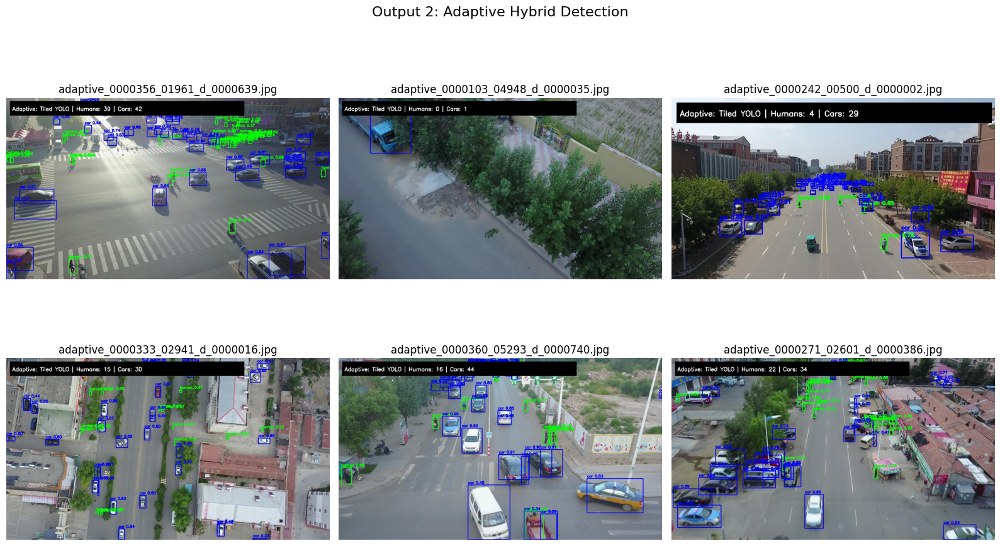

In [32]:
show_images_from_folder(OUTPUT_2_ADAPTIVE, "Output 2: Adaptive Hybrid Detection")

# <span style="color:red; font-size:32px;"><b><i>Output 3 — Crowd density heatmap</i></b></span>

In [33]:
def create_density_heatmap(image_path, boxes, classes, output_path, title_text="Human Density Heatmap"):
    image = cv2.imread(str(image_path))
    h, w, _ = image.shape

    heatmap = np.zeros((h, w), dtype=np.float32)

    human_count = 0

    for box, cls_id in zip(boxes, classes):
        cls_id = int(cls_id)

        if cls_id != 0:
            continue

        human_count += 1

        x1, y1, x2, y2 = box.astype(int)
        cx = int((x1 + x2) / 2)
        cy = int((y1 + y2) / 2)

        radius = max(20, int(min(w, h) * 0.03))
        cv2.circle(heatmap, (cx, cy), radius=radius, color=1.0, thickness=-1)

    heatmap = cv2.GaussianBlur(heatmap, (0, 0), sigmaX=25, sigmaY=25)

    if heatmap.max() > 0:
        heatmap = heatmap / heatmap.max()

    heatmap_color = cv2.applyColorMap((heatmap * 255).astype(np.uint8), cv2.COLORMAP_JET)
    overlay = cv2.addWeighted(image, 0.65, heatmap_color, 0.35, 0)

    cv2.rectangle(overlay, (15, 15), (min(850, w - 10), 75), (0, 0, 0), -1)
    cv2.putText(
        overlay,
        f"{title_text} | Humans: {human_count}",
        (25, 55),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.8,
        (255, 255, 255),
        2
    )

    cv2.imwrite(str(output_path), overlay)

    return human_count


density_records = []

for img_path in tqdm(sample_val_images):
    boxes, scores, classes, method_used, decision_info = adaptive_hybrid_detect(
        image_path=img_path,
        model=detector,
        normal_conf=NORMAL_CONF,
        tiled_conf=TILED_CONF,
        normal_imgsz=IMAGE_SIZE,
        tile_size=TILE_SIZE,
        tile_overlap=TILE_OVERLAP,
        tile_imgsz=TILE_IMGSZ,
        nms_iou=NMS_IOU
    )

    output_path = OUTPUT_3_DENSITY / f"density_{img_path.name}"

    humans = create_density_heatmap(
        image_path=img_path,
        boxes=boxes,
        classes=classes,
        output_path=output_path,
        title_text="Crowd Density"
    )

    density_records.append({
        "image": img_path.name,
        "humans": humans,
        "source_detection": method_used,
        "output_path": str(output_path)
    })

density_df = pd.DataFrame(density_records)
density_df

100%|██████████| 10/10 [00:03<00:00,  2.92it/s]


,image,humans,source_detection,output_path
0,0000356_01961_d_0000639.jpg,39,Adaptive: Tiled YOLO,/kaggle/working/output_3_crowd_density/density...
1,0000289_06401_d_0000843.jpg,26,Adaptive: Tiled YOLO,/kaggle/working/output_3_crowd_density/density...
2,0000154_02001_d_0000001.jpg,56,Adaptive: Tiled YOLO,/kaggle/working/output_3_crowd_density/density...
3,0000103_04948_d_0000035.jpg,0,Adaptive: Tiled YOLO,/kaggle/working/output_3_crowd_density/density...
4,0000360_05293_d_0000740.jpg,16,Adaptive: Tiled YOLO,/kaggle/working/output_3_crowd_density/density...
5,0000242_00500_d_0000002.jpg,4,Adaptive: Tiled YOLO,/kaggle/working/output_3_crowd_density/density...
6,0000291_04001_d_0000888.jpg,58,Adaptive: Tiled YOLO,/kaggle/working/output_3_crowd_density/density...
7,0000360_02353_d_0000725.jpg,24,Adaptive: Tiled YOLO,/kaggle/working/output_3_crowd_density/density...
8,0000271_02601_d_0000386.jpg,22,Adaptive: Tiled YOLO,/kaggle/working/output_3_crowd_density/density...
9,0000333_02941_d_0000016.jpg,15,Adaptive: Tiled YOLO,/kaggle/working/output_3_crowd_density/density...


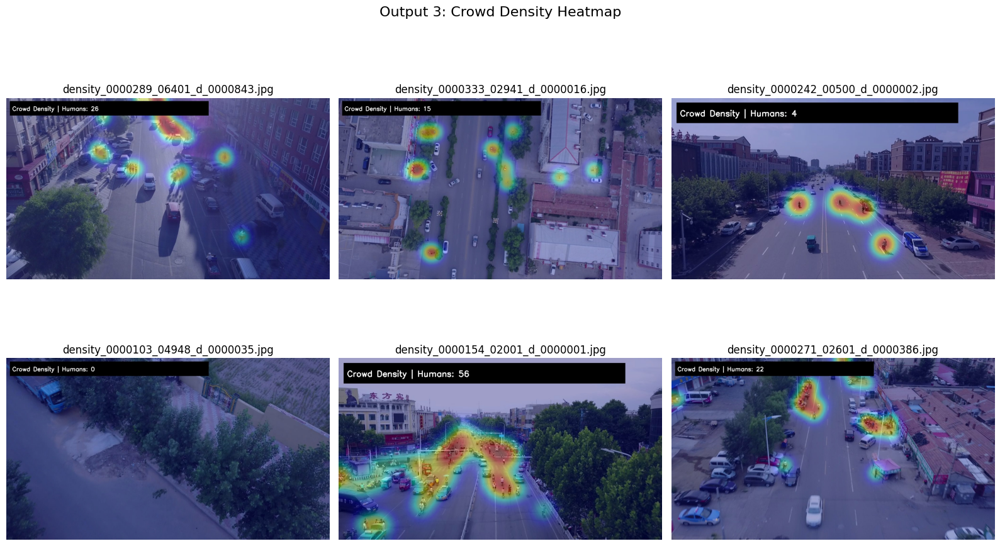

In [34]:
show_images_from_folder(OUTPUT_3_DENSITY, "Output 3: Crowd Density Heatmap")

# <span style="color:red; font-size:32px;"><b><i>Output 4 — Always tiled YOLO detection</i></b></span>

In [35]:
tiled_records = []

for img_path in tqdm(sample_val_images):
    start_time = time.time()

    boxes, scores, classes = tiled_yolo_detect(
        image_path=img_path,
        model=detector,
        tile_size=TILE_SIZE,
        overlap=TILE_OVERLAP,
        conf=TILED_CONF,
        imgsz=TILE_IMGSZ,
        nms_iou=NMS_IOU
    )

    output_path = OUTPUT_4_TILED / f"tiled_{img_path.name}"

    humans, cars = draw_boxes_and_count(
        image_path=img_path,
        boxes=boxes,
        scores=scores,
        classes=classes,
        output_path=output_path,
        title_text="Always Tiled YOLO"
    )

    elapsed = time.time() - start_time

    tiled_records.append({
        "image": img_path.name,
        "method": "Always Tiled YOLO",
        "humans": humans,
        "cars": cars,
        "time_sec": elapsed,
        "output_path": str(output_path)
    })

tiled_df = pd.DataFrame(tiled_records)
tiled_df

100%|██████████| 10/10 [00:02<00:00,  4.16it/s]


,image,method,humans,cars,time_sec,output_path
0,0000356_01961_d_0000639.jpg,Always Tiled YOLO,39,42,0.347348,/kaggle/working/output_4_always_tiled_yolo/til...
1,0000289_06401_d_0000843.jpg,Always Tiled YOLO,26,49,0.241810,/kaggle/working/output_4_always_tiled_yolo/til...
2,0000154_02001_d_0000001.jpg,Always Tiled YOLO,56,26,0.192405,/kaggle/working/output_4_always_tiled_yolo/til...
3,0000103_04948_d_0000035.jpg,Always Tiled YOLO,0,1,0.223868,/kaggle/working/output_4_always_tiled_yolo/til...
4,0000360_05293_d_0000740.jpg,Always Tiled YOLO,16,44,0.241776,/kaggle/working/output_4_always_tiled_yolo/til...
5,0000242_00500_d_0000002.jpg,Always Tiled YOLO,4,29,0.176785,/kaggle/working/output_4_always_tiled_yolo/til...
6,0000291_04001_d_0000888.jpg,Always Tiled YOLO,58,43,0.251307,/kaggle/working/output_4_always_tiled_yolo/til...
7,0000360_02353_d_0000725.jpg,Always Tiled YOLO,24,47,0.242630,/kaggle/working/output_4_always_tiled_yolo/til...
8,0000271_02601_d_0000386.jpg,Always Tiled YOLO,22,34,0.239656,/kaggle/working/output_4_always_tiled_yolo/til...
9,0000333_02941_d_0000016.jpg,Always Tiled YOLO,15,30,0.236517,/kaggle/working/output_4_always_tiled_yolo/til...


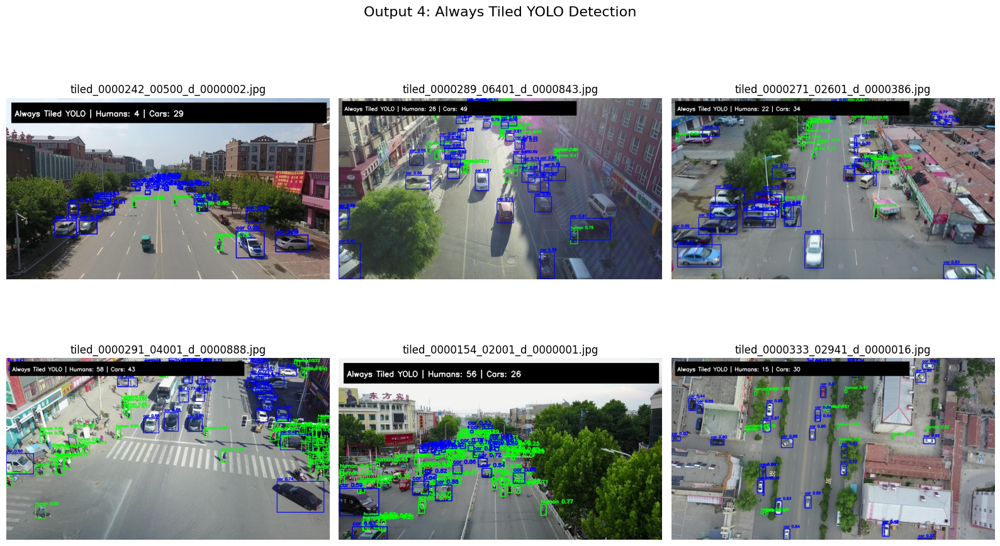

In [36]:
show_images_from_folder(OUTPUT_4_TILED, "Output 4: Always Tiled YOLO Detection")

# <span style="color:red; font-size:32px;"><b><i>Compare detection modes</i></b></span>

In [37]:
comparison_df = normal_df[["image", "humans", "cars", "time_sec"]].rename(
    columns={
        "humans": "normal_humans",
        "cars": "normal_cars",
        "time_sec": "normal_time_sec"
    }
)

comparison_df = comparison_df.merge(
    adaptive_df[["image", "method", "humans", "cars", "time_sec"]].rename(
        columns={
            "method": "adaptive_method",
            "humans": "adaptive_humans",
            "cars": "adaptive_cars",
            "time_sec": "adaptive_time_sec"
        }
    ),
    on="image",
    how="left"
)

comparison_df = comparison_df.merge(
    tiled_df[["image", "humans", "cars", "time_sec"]].rename(
        columns={
            "humans": "tiled_humans",
            "cars": "tiled_cars",
            "time_sec": "tiled_time_sec"
        }
    ),
    on="image",
    how="left"
)

comparison_df["tiled_minus_normal_humans"] = comparison_df["tiled_humans"] - comparison_df["normal_humans"]
comparison_df["adaptive_minus_normal_humans"] = comparison_df["adaptive_humans"] - comparison_df["normal_humans"]

COMPARISON_CSV = WORK_ROOT / "detection_mode_comparison.csv"
comparison_df.to_csv(COMPARISON_CSV, index=False)

comparison_df

,image,normal_humans,normal_cars,normal_time_sec,adaptive_method,adaptive_humans,adaptive_cars,adaptive_time_sec,tiled_humans,tiled_cars,tiled_time_sec,tiled_minus_normal_humans,adaptive_minus_normal_humans
0,0000356_01961_d_0000639.jpg,19,35,0.359670,Adaptive: Tiled YOLO,39,42,0.418569,39,42,0.347348,20,20
1,0000289_06401_d_0000843.jpg,22,36,0.061491,Adaptive: Tiled YOLO,26,49,0.293004,26,49,0.241810,4,4
2,0000154_02001_d_0000001.jpg,41,19,0.051273,Adaptive: Tiled YOLO,56,26,0.226059,56,26,0.192405,15,15
3,0000103_04948_d_0000035.jpg,0,0,0.051771,Adaptive: Tiled YOLO,0,1,0.264621,0,1,0.223868,0,0
4,0000360_05293_d_0000740.jpg,14,33,0.053779,Adaptive: Tiled YOLO,16,44,0.282237,16,44,0.241776,2,2
5,0000242_00500_d_0000002.jpg,4,21,0.043312,Adaptive: Tiled YOLO,4,29,0.211633,4,29,0.176785,0,0
6,0000291_04001_d_0000888.jpg,49,34,0.058633,Adaptive: Tiled YOLO,58,43,0.290413,58,43,0.251307,9,9
7,0000360_02353_d_0000725.jpg,21,37,0.055843,Adaptive: Tiled YOLO,24,47,0.284764,24,47,0.242630,3,3
8,0000271_02601_d_0000386.jpg,21,24,0.049589,Adaptive: Tiled YOLO,22,34,0.278706,22,34,0.239656,1,1
9,0000333_02941_d_0000016.jpg,11,24,0.047236,Adaptive: Tiled YOLO,15,30,0.278080,15,30,0.236517,4,4


# <span style="color:red; font-size:32px;"><b><i>Plot comparison</i></b></span>

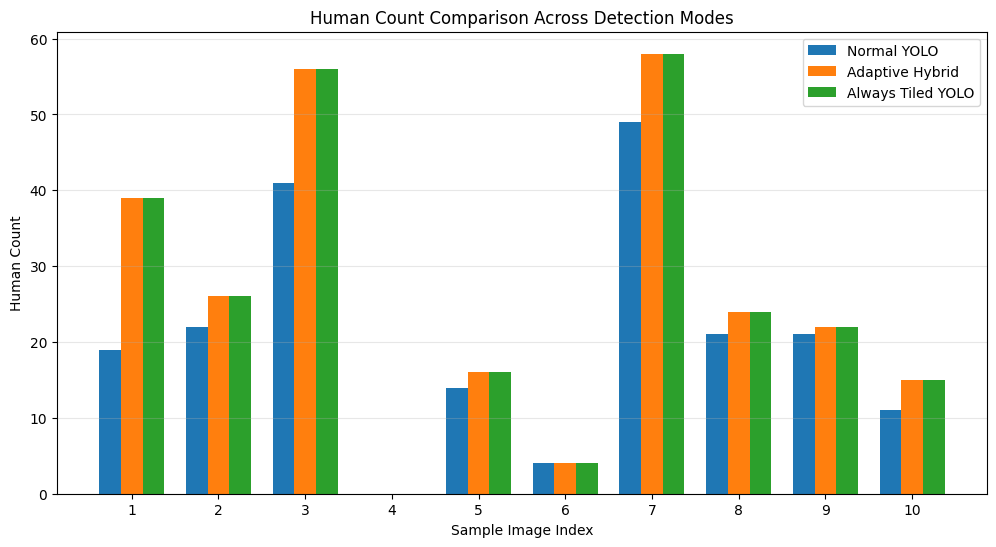

In [38]:
plt.figure(figsize=(12, 6))

x = np.arange(len(comparison_df))
width = 0.25

plt.bar(x - width, comparison_df["normal_humans"], width, label="Normal YOLO")
plt.bar(x, comparison_df["adaptive_humans"], width, label="Adaptive Hybrid")
plt.bar(x + width, comparison_df["tiled_humans"], width, label="Always Tiled YOLO")

plt.xlabel("Sample Image Index")
plt.ylabel("Human Count")
plt.title("Human Count Comparison Across Detection Modes")
plt.xticks(x, range(1, len(comparison_df) + 1))
plt.legend()
plt.grid(axis="y", alpha=0.3)
plt.show()

# <span style="color:red; font-size:32px;"><b><i>Evaluate trained model</i></b></span>

In [39]:
metrics = detector.val(
    data=str(FINAL_YAML_PATH),
    imgsz=IMAGE_SIZE,
    conf=NORMAL_CONF,
    device=DEVICE,
    project="/kaggle/working/evaluation",
    name="yolo_eval"
)

precision = float(metrics.box.mp)
recall = float(metrics.box.mr)
map50 = float(metrics.box.map50)
map50_95 = float(metrics.box.map)

print("Precision:", precision)
print("Recall:", recall)
print("mAP50:", map50)
print("mAP50-95:", map50_95)

Ultralytics 8.4.50 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1945.0±595.2 MB/s, size: 116.8 KB)
val: Scanning /kaggle/working/drone_human_car_dataset/labels/val.cache... 548 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 548/548 209.0Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 35/35 1.4it/s 25.5s
                   all        548      28033       0.82      0.718      0.712      0.451
                 human        531      13969      0.773      0.615      0.602      0.292
                   car        515      14064      0.867      0.822      0.822      0.609
Speed: 1.5ms preprocess, 37.8ms inference, 0.0ms loss, 2.0ms postprocess per image
Results saved to /kaggle/working/evaluation/yolo_eval
Precision: 0.8197492959025636
Recall: 0.7182331412761257
mAP50: 0.7123536282726115
mAP50-95: 0.45052609688639145


# <span style="color:red; font-size:32px;"><b><i>Calculate normal YOLO FPS</i></b></span>

In [40]:
fps_images = sample_val_images[:10]
total_time = 0

for img_path in fps_images:
    start_time = time.time()

    _ = normal_yolo_detect(
        image_path=img_path,
        model=detector,
        conf=NORMAL_CONF,
        imgsz=IMAGE_SIZE
    )

    end_time = time.time()
    total_time += end_time - start_time

avg_normal_time = total_time / len(fps_images)
normal_fps = 1 / avg_normal_time

print("Normal YOLO average time:", avg_normal_time)
print("Normal YOLO approximate FPS:", normal_fps)

Normal YOLO average time: 0.05003414154052734
Normal YOLO approximate FPS: 19.98635270258422


# <span style="color:red; font-size:32px;"><b><i>Calculate tiled YOLO FPS</i></b></span>

In [41]:
fps_images = sample_val_images[:5]
total_time = 0

for img_path in fps_images:
    start_time = time.time()

    _ = tiled_yolo_detect(
        image_path=img_path,
        model=detector,
        tile_size=TILE_SIZE,
        overlap=TILE_OVERLAP,
        conf=TILED_CONF,
        imgsz=TILE_IMGSZ,
        nms_iou=NMS_IOU
    )

    end_time = time.time()
    total_time += end_time - start_time

avg_tiled_time = total_time / len(fps_images)
tiled_fps = 1 / avg_tiled_time

print("Tiled YOLO average time:", avg_tiled_time)
print("Tiled YOLO approximate FPS:", tiled_fps)

Tiled YOLO average time: 0.2275482177734375
Tiled YOLO approximate FPS: 4.3946729611201265


# <span style="color:red; font-size:32px;"><b><i>Summary</i></b></span>

In [42]:
summary = {
    "model": MODEL_NAME,
    "image_size": IMAGE_SIZE,
    "epochs": EPOCHS,
    "batch": BATCH,
    "normal_conf": NORMAL_CONF,
    "tiled_conf": TILED_CONF,
    "tile_size": TILE_SIZE,
    "tile_overlap": TILE_OVERLAP,
    "nms_iou": NMS_IOU,
    "precision": precision,
    "recall": recall,
    "mAP50": map50,
    "mAP50_95": map50_95,
    "normal_avg_time_sec": avg_normal_time,
    "normal_fps": normal_fps,
    "tiled_avg_time_sec": avg_tiled_time,
    "tiled_fps": tiled_fps
}

summary_df = pd.DataFrame([summary])

SUMMARY_PATH = WORK_ROOT / "evaluation_summary.csv"
summary_df.to_csv(SUMMARY_PATH, index=False)

summary_df

,model,image_size,epochs,batch,normal_conf,tiled_conf,tile_size,tile_overlap,nms_iou,precision,recall,mAP50,mAP50_95,normal_avg_time_sec,normal_fps,tiled_avg_time_sec,tiled_fps
0,yolo11m.pt,960,50,8,0.25,0.2,512,0.25,0.5,0.819749,0.718233,0.712354,0.450526,0.050034,19.986353,0.227548,4.394673


# <span style="color:red; font-size:32px;"><b><i>Optional ByteTrack tracking</i></b></span>

In [43]:
RUN_TRACKING = True

if RUN_TRACKING:
    DEMO_VIDEO_PATH = WORK_ROOT / "demo_input_video.mp4"

    video_images = sample_val_images[:30]

    first_img = cv2.imread(str(video_images[0]))
    height, width, _ = first_img.shape

    fourcc = cv2.VideoWriter_fourcc(*"mp4v")
    video_writer = cv2.VideoWriter(str(DEMO_VIDEO_PATH), fourcc, 5, (width, height))

    for img_path in video_images:
        img = cv2.imread(str(img_path))
        img = cv2.resize(img, (width, height))
        video_writer.write(img)

    video_writer.release()

    TRACK_OUTPUT_DIR = WORK_ROOT / "output_5_optional_tracking"
    TRACK_OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

    tracking_results = detector.track(
        source=str(DEMO_VIDEO_PATH),
        tracker="bytetrack.yaml",
        conf=NORMAL_CONF,
        imgsz=IMAGE_SIZE,
        save=True,
        project=str(TRACK_OUTPUT_DIR),
        name="bytetrack_demo"
    )

    print("Tracking output saved at:", TRACK_OUTPUT_DIR)

requirements: Ultralytics requirement ['lap>=0.5.12'] not found, attempting AutoUpdate...
Using Python 3.12.12 environment at: /usr
Resolved 2 packages in 248ms
 Downloaded lap
Prepared 1 package in 287ms
Installed 1 package in 4ms
 + lap==0.5.13

requirements: AutoUpdate success ✅ 1.0s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect

WARNING ⚠️ 
Inference results will accumulate in RAM unless `stream=True` is passed, which can cause out-of-memory errors for large
sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

Results saved to /kaggle/working/output_5_optional_tracking/bytetrack_demo
Tracking o

In [44]:
REPORT_PATH = WORK_ROOT / "project_report.md"

report_text = f"""
# Drone Human and Car Detection System

## Project Overview
This project builds a computer vision pipeline for drone/aerial images. The system detects humans and cars, counts total humans, visualizes results, evaluates model performance, and adds a creative small-object detection strategy.

## Dataset Understanding
The dataset contains drone/aerial images with YOLO-format labels.

Each label line follows:

class_id x_center y_center width height

The coordinates are normalized between 0 and 1.

## Preprocessing
The original dataset contains multiple classes. For this task, only human and car-related classes were used.

Class mapping:

- pedestrian -> human
- people -> human
- car -> car

Final classes:

- 0: human
- 1: car

Images without human or car labels were removed from the filtered training dataset.

## Why Labels Are Used
Labels are used during training to teach the model where objects are located and what class they belong to. They are also used during validation to calculate precision, recall, and mAP. During final inference or demo, the model uses only images and predicts boxes by itself.

## Model Training
Model used: {MODEL_NAME}
Image size: {IMAGE_SIZE}
Epochs: {EPOCHS}
Batch size: {BATCH}

YOLO was fine-tuned using transfer learning.

## Output 1: Normal YOLO Detection
The first output uses standard full-image YOLO detection. It detects humans and cars, draws bounding boxes, and displays total human count.

## Output 2: Adaptive Hybrid Detection
The adaptive system first checks whether the image is high-resolution, crowded, or small-object-heavy. If the image is normal, it uses normal YOLO. If the image is likely difficult for aerial detection, it switches to tiled YOLO.

## Output 3: Crowd Density Heatmap
The crowd density output uses detected human centers to visualize crowded areas in the image.

## Output 4: Always Tiled YOLO Detection
This output always splits the image into overlapping tiles, runs YOLO on every tile, merges predictions, removes duplicate boxes using NMS, and displays final detections. This helps test how tiled detection behaves compared with normal YOLO.

## Creative Detection Contribution
The creative part is the adaptive and tiled small-object detection pipeline. Instead of only using standard YOLO, the system includes a drone-specific detection strategy for small and crowded aerial objects.

## Detection Settings
Normal confidence: {NORMAL_CONF}
Tiled confidence: {TILED_CONF}
Tile size: {TILE_SIZE}
Tile overlap: {TILE_OVERLAP}
NMS IoU: {NMS_IOU}

## Human Counting Logic
The system counts every detected bounding box where class ID is 0, because class 0 represents human.

## Evaluation Metrics
Precision: {precision:.4f}
Recall: {recall:.4f}
mAP50: {map50:.4f}
mAP50-95: {map50_95:.4f}
Normal YOLO FPS: {normal_fps:.2f}
Tiled YOLO FPS: {tiled_fps:.2f}

## Strengths
- Detects both humans and cars.
- Counts total humans.
- Provides required bounding box visualization.
- Adds adaptive small-object detection.
- Adds always-tiled detection for comparison.
- Adds crowd density visualization.
- Includes evaluation metrics and FPS.

## Limitations
- Tiled YOLO is slower than normal YOLO.
- Tiled detection can produce duplicate boxes, so NMS is required.
- Very small or heavily occluded humans may still be missed.
- Cars and similar vehicles may be confused in aerial views.
- Image quality, lighting, altitude, and angle affect performance.

## Challenges Faced
Drone images contain small objects, crowded scenes, occlusion, and large scale variation. The tiled detection strategy was added to address these small-object challenges.
"""

with open(REPORT_PATH, "w") as f:
    f.write(report_text)

print("Report saved:", REPORT_PATH)
print(report_text)

Report saved: /kaggle/working/project_report.md

# Drone Human and Car Detection System

## Project Overview
This project builds a computer vision pipeline for drone/aerial images. The system detects humans and cars, counts total humans, visualizes results, evaluates model performance, and adds a creative small-object detection strategy.

## Dataset Understanding
The dataset contains drone/aerial images with YOLO-format labels.

Each label line follows:

class_id x_center y_center width height

The coordinates are normalized between 0 and 1.

## Preprocessing
The original dataset contains multiple classes. For this task, only human and car-related classes were used.

Class mapping:

- pedestrian -> human
- people -> human
- car -> car

Final classes:

- 0: human
- 1: car

Images without human or car labels were removed from the filtered training dataset.

## Why Labels Are Used
Labels are used during training to teach the model where objects are located and what class they belong to. T

In [45]:
README_PATH = WORK_ROOT / "README.md"

readme_text = """
# Drone Human and Car Detection System

## Overview
This project detects humans and cars from drone/aerial images. It also counts total humans and visualizes outputs with bounding boxes.

## Dataset
The VisDrone dataset was used. The original labels are in YOLO format.

## Final Classes
- 0: human
- 1: car

## Class Mapping
- pedestrian -> human
- people -> human
- car -> car

## Model
YOLO was fine-tuned for human and car detection.

## Outputs
This project generates four major outputs:

1. Normal YOLO detection
2. Adaptive hybrid detection
3. Crowd density heatmap
4. Always tiled YOLO detection

## Creative Contribution
The creative part is the adaptive and tiled small-object drone detection pipeline.

Normal YOLO works on the full image. However, drone images often contain very small humans and cars. Therefore, the system also uses tiled YOLO detection, where the image is divided into overlapping tiles, YOLO runs on each tile, and predictions are merged with NMS.

The adaptive system chooses normal YOLO or tiled YOLO based on image condition.

## Detection Settings
- Normal confidence: 0.25
- Tiled confidence: 0.20
- Tile size: 512
- Tile overlap: 0.25
- NMS IoU: 0.50

## Human Counting
Human counting is done by counting all predicted bounding boxes with class ID 0.

## Evaluation
The project reports:

- Precision
- Recall
- mAP50
- mAP50-95
- FPS

## Limitations
Tiled YOLO can detect small objects better, but it is slower and may create duplicate boxes before NMS. Dense crowds, low resolution, and occlusion remain challenging.
"""

with open(README_PATH, "w") as f:
    f.write(readme_text)

print("README saved:", README_PATH)

README saved: /kaggle/working/README.md


In [46]:
REQ_PATH = WORK_ROOT / "requirements.txt"

requirements_text = """
ultralytics
opencv-python
matplotlib
pandas
numpy
tqdm
pyyaml
torch
"""

with open(REQ_PATH, "w") as f:
    f.write(requirements_text.strip())

print(open(REQ_PATH).read())

ultralytics
opencv-python
matplotlib
pandas
numpy
tqdm
pyyaml
torch


In [47]:
ZIP_PATH = "/kaggle/working/drone_human_car_detection_project.zip"

!zip -r {ZIP_PATH} \
/kaggle/working/output_1_normal_yolo \
/kaggle/working/output_2_adaptive_hybrid \
/kaggle/working/output_3_crowd_density \
/kaggle/working/output_4_always_tiled_yolo \
/kaggle/working/evaluation_summary.csv \
/kaggle/working/detection_mode_comparison.csv \
/kaggle/working/project_report.md \
/kaggle/working/README.md \
/kaggle/working/requirements.txt \
/kaggle/working/runs/yolo_human_car_detector/weights/best.pt

print("Project zip saved:", ZIP_PATH)

  adding: kaggle/working/output_1_normal_yolo/ (stored 0%)
  adding: kaggle/working/output_1_normal_yolo/normal_0000289_06401_d_0000843.jpg (deflated 4%)
  adding: kaggle/working/output_1_normal_yolo/normal_0000103_04948_d_0000035.jpg (deflated 4%)
  adding: kaggle/working/output_1_normal_yolo/normal_0000271_02601_d_0000386.jpg (deflated 4%)
  adding: kaggle/working/output_1_normal_yolo/normal_0000154_02001_d_0000001.jpg (deflated 5%)
  adding: kaggle/working/output_1_normal_yolo/normal_0000291_04001_d_0000888.jpg (deflated 3%)
  adding: kaggle/working/output_1_normal_yolo/normal_0000360_02353_d_0000725.jpg (deflated 3%)
  adding: kaggle/working/output_1_normal_yolo/normal_0000356_01961_d_0000639.jpg (deflated 3%)
  adding: kaggle/working/output_1_normal_yolo/normal_0000360_05293_d_0000740.jpg (deflated 4%)
  adding: kaggle/working/output_1_normal_yolo/normal_0000333_02941_d_0000016.jpg (deflated 3%)
  adding: kaggle/working/output_1_normal_yolo/normal_0000242_00500_d_0000002.jpg (defl